In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

In [2]:
database = input("Ingrese si el nuevo empleado será líder o empleado (L), (E), o (NA): ").strip().upper()

if database == "L":
    database = pd.read_csv('../data/data_leaders.csv')
elif database == "E":
    database = pd.read_csv('../data/data_no_leaders.csv')
elif database == "NA":
    database = pd.read_csv('../data/data_global_clean.csv')
else:
    print("Entrada inválida. Se usará data_global_clean.csv por defecto.")
    database = pd.read_csv('../data/data_global_clean.csv')


In [3]:
database['Location'].value_counts().sort_index()

Location
AR/CABA/BA        3516
CL/RM/SCL         1398
CO/ANT/MED        1219
CO/CUN/BOG        2761
MX/CDMX/CDMX      1882
MX/JALISCO/GDL     590
Name: count, dtype: int64

In [4]:
def pedir_locations(df):
    # Si no hay columna Location
    if "Location" not in df.columns:
        print("⚠️ La base cargada no contiene columna 'Location'.")
        print("   → Se omitirá la selección de ubicación.\n")
        return {"tipo": "sin_location", "locations": None}

    # Todas las locations disponibles en esa base
    locations = sorted(df["Location"].dropna().unique())

    # Índice para la opción "no se sabe"
    idx_unknown = len(locations) + 1

    print("Seleccione las posibles ubicaciones del nuevo integrante:")
    for i, loc in enumerate(locations, start=1):
        print(f"{i}. {loc}")
    print(f"{idx_unknown}. No se sabe / ubicación desconocida")
    print("0. Terminar selección\n")

    seleccionadas = []
    unknown = False

    while True:
        respuesta = input("Ingrese el número de la ubicación (0 para terminar): ").strip()

        # salir
        if respuesta == "0":
            break

        opcion = int(respuesta)

        # Opción "no se sabe"
        if opcion == idx_unknown:
            unknown = True

            break

        # Rango válido de locations
        if 1 <= opcion <= len(locations):
            seleccionadas.append(locations[opcion - 1])
            print("✔ Agregada:", locations[opcion - 1])
        else:
            print("❌ Número fuera de rango.")

    
    data = df[df["Location"].isin(seleccionadas)]
    
    if unknown:
        return locations, df
    elif seleccionadas:
        return sorted(seleccionadas), data
    else:
        # no eligió nada y tampoco marcó desconocida
        return locations, df
ubicaciones_nuevas, data_1 = pedir_locations(database)





Seleccione las posibles ubicaciones del nuevo integrante:
1. AR/CABA/BA
2. CL/RM/SCL
3. CO/ANT/MED
4. CO/CUN/BOG
5. MX/CDMX/CDMX
6. MX/JALISCO/GDL
7. No se sabe / ubicación desconocida
0. Terminar selección



In [5]:
def pedir_equipo(df):
    if "Team Name" not in df.columns:
        print("⚠️ La base cargada no contiene columna 'Team Name'.")
        print("   → Se omitirá la selección de Equipo.\n")
        return {"tipo": "sin_Team_Name", "Teams": None}

    # Todas las Team Name disponibles en esa base
    teams = sorted(df["Team Name"].dropna().unique())

    # Índice para la opción "no se sabe"
    idx_unknown = len(teams) + 1

    print("Seleccione los posibles equipos del nuevo integrante:")
    for i, loc in enumerate(teams, start=1):
        print(f"{i}. {loc}")
    print(f"{idx_unknown}. No se sabe / equipo desconocido")
    print("0. Terminar selección\n")

    seleccionadas = []
    unknown = False

    while True:
        respuesta = input("Ingrese el número de equipo (0 para terminar): ").strip()

        # salir
        if respuesta == "0":
            break

        opcion = int(respuesta)

        # Opción "no se sabe"
        if opcion == idx_unknown:
            unknown = True

            break

        # Rango válido de locations
        if 1 <= opcion <= len(teams):
            seleccionadas.append(teams[opcion - 1])
            print("✔ Agregada:", teams[opcion - 1])
        else:
            print("❌ Número fuera de rango.")

    
    data = df[df["Team Name"].isin(seleccionadas)]
    
    if unknown:
        return teams, df
    elif seleccionadas:
        return sorted(seleccionadas), data
    else:
        # no eligió nada y tampoco marcó desconocida
        return teams, df
equipos_nuevos, data_2 = pedir_equipo(data_1)





Seleccione los posibles equipos del nuevo integrante:
1. Breaking Badger
2. Fight Club Penguin
3. Finding Nemo's Friends
4. Game of Tones
5. Jurassic Bark
6. Paws and Recreation
7. Star Wars: The Furry Awakens
8. The Great Catsby
9. The Lion Kingpin
10. The Matrix Mice
11. No se sabe / equipo desconocido
0. Terminar selección



In [6]:
def pedir_seniority(df):
    if "Seniority" not in df.columns:
        print("⚠️ La base cargada no contiene columna 'Seniority'.")
        print("   → Se omitirá la selección de Seniority.\n")
        return {"tipo": "sin_Seniority", "Seniority": None}

    # Todas las senior en esa base
    senior = sorted(df["Seniority"].dropna().unique())

    # Índice para la opción "no se sabe"
    idx_unknown = len(senior) + 1

    print("Seleccione los posibles seniority del nuevo integrante:")
    for i, loc in enumerate(senior, start=1):
        print(f"{i}. {loc}")
    print(f"{idx_unknown}. No se sabe / seniority desconocido")
    print("0. Terminar selección\n")

    seleccionadas = []
    unknown = False

    while True:
        respuesta = input("Ingrese el número de seniority (0 para terminar): ").strip()

        # salir
        if respuesta == "0":
            break

        opcion = int(respuesta)

        # Opción "no se sabe"
        if opcion == idx_unknown:
            unknown = True

            break

        # Rango válido de locations
        if 1 <= opcion <= len(senior):
            seleccionadas.append(senior[opcion - 1])
            print("✔ Agregada:", senior[opcion - 1])
        else:
            print("❌ Número fuera de rango.")

    
    data = df[df["Seniority"].isin(seleccionadas)]
    
    if unknown:
        return senior, df
    elif seleccionadas:
        return sorted(seleccionadas), data
    else:
        # no eligió nada y tampoco marcó desconocida
        return senior, df
seniority_nuevos, data_3 = pedir_seniority(data_2)





Seleccione los posibles seniority del nuevo integrante:
1. Jr
2. Sr Level 1
3. Sr Level 2
4. Sr Level 3
5. Ssr
6. No se sabe / seniority desconocido
0. Terminar selección



In [7]:
database.groupby("Position")["Studio"].unique()

Position
Business Analyst                        [Product]
Business Intelligence                      [Data]
Cybersecurity Specialist              [Cloud Ops]
Data Analyst                               [Data]
Database Administrator                [Cloud Ops]
DevOps Engineer                       [Cloud Ops]
Product Owner                           [Product]
Project Manager                        [Delivery]
Quality Assurance Tester    [Quality Engineering]
Software Developer                  [Engineering]
Solutions Architect                 [Engineering]
Technology Consultant               [Engineering]
Test Automation Engineer    [Quality Engineering]
User Experience Designer                 [Design]
Visual Designer                          [Design]
Name: Studio, dtype: object

In [8]:
database.groupby("Studio")["Position"].unique()


Studio
Cloud Ops              [DevOps Engineer, Cybersecurity Specialist, Da...
Data                               [Business Intelligence, Data Analyst]
Delivery                                               [Project Manager]
Design                       [User Experience Designer, Visual Designer]
Engineering            [Software Developer, Solutions Architect, Tech...
Product                                [Business Analyst, Product Owner]
Quality Engineering    [Quality Assurance Tester, Test Automation Eng...
Name: Position, dtype: object

In [9]:
def pedir_studio(df):
    if "Studio" not in df.columns:
        print("⚠️ La base cargada no contiene columna 'Studio'.")
        print("   → Se omitirá la selección de Studio.\n")
        return {"tipo": "sin_Studio", "Studio": None}

    # Todas los studios disponibles en esa base
    studio = sorted(df["Studio"].dropna().unique())

    # Índice para la opción "no se sabe"
    idx_unknown = len(studio) + 1

    print("Seleccione los posibles estudios del nuevo integrante:")
    for i, loc in enumerate(studio, start=1):
        print(f"{i}. {loc}")
    print(f"{idx_unknown}. No se sabe / estudio desconocido")
    print("0. Terminar selección\n")

    seleccionadas = []
    unknown = False

    while True:
        respuesta = input("Ingrese el número de estdio (0 para terminar): ").strip()

        # salir
        if respuesta == "0":
            break

        opcion = int(respuesta)

        # Opción "no se sabe"
        if opcion == idx_unknown:
            unknown = True

            break

        # Rango válido de Studio
        if 1 <= opcion <= len(studio):
            seleccionadas.append(studio[opcion - 1])
            print("✔ Agregada:", studio[opcion - 1])
        else:
            print("❌ Número fuera de rango.")

    
    data = df[df["Studio"].isin(seleccionadas)]
    
    if unknown:
        return studio, df
    elif seleccionadas:
        return sorted(seleccionadas), data
    else:
        # no eligió nada y tampoco marcó desconocida
        return studio, df
studio_nuevo, data_4 = pedir_studio(data_3)





Seleccione los posibles estudios del nuevo integrante:
1. Cloud Ops
2. Data
3. Delivery
4. Design
5. Engineering
6. Product
7. Quality Engineering
8. No se sabe / estudio desconocido
0. Terminar selección



In [10]:
def pedir_position(df):
    if "Position" not in df.columns:
        print("⚠️ La base cargada no contiene columna 'Position'.")
        print("   → Se omitirá la selección de Position.\n")
        return {"tipo": "sin_Position", "Studio": None}

    positions = sorted(df["Position"].dropna().unique())

    # Índice para la opción "no se sabe"
    idx_unknown = len(positions) + 1

    print("Seleccione las posibles posiciones del nuevo integrante:")
    for i, loc in enumerate(positions, start=1):
        print(f"{i}. {loc}")
    print(f"{idx_unknown}. No se sabe / estudio desconocido")
    print("0. Terminar selección\n")

    seleccionadas = []
    unknown = False

    while True:
        respuesta = input("Ingrese el número de position (0 para terminar): ").strip()

        # salir
        if respuesta == "0":
            break

        opcion = int(respuesta)

        # Opción "no se sabe"
        if opcion == idx_unknown:
            unknown = True

            break

        # Rango válido de Position
        if 1 <= opcion <= len(positions):
            seleccionadas.append(positions[opcion - 1])
            print("✔ Agregada:", positions[opcion - 1])
        else:
            print("❌ Número fuera de rango.")

    
    data = df[df["Position"].isin(seleccionadas)]
    
    if unknown:
        return positions, df
    elif seleccionadas:
        return sorted(seleccionadas), data
    else:
        # no eligió nada y tampoco marcó desconocida
        return positions, df
positiones_nuevas, data_5 = pedir_position(data_4)





Seleccione las posibles posiciones del nuevo integrante:
1. Business Analyst
2. Business Intelligence
3. Cybersecurity Specialist
4. Data Analyst
5. Database Administrator
6. DevOps Engineer
7. Product Owner
8. Project Manager
9. Quality Assurance Tester
10. Software Developer
11. Solutions Architect
12. Technology Consultant
13. Test Automation Engineer
14. User Experience Designer
15. Visual Designer
16. No se sabe / estudio desconocido
0. Terminar selección



In [11]:
data=data_5

In [12]:
data['Engagement'].value_counts().sort_index()


Engagement
0.00    268
0.03     19
0.05     10
0.07      7
0.08      8
       ... 
4.96      7
4.97     18
4.98      5
4.99      4
5.00    243
Name: count, Length: 372, dtype: int64

In [13]:
data = data[[ 'Month', 'Day', 'Engagement', "ID" ]]

In [18]:
i = 0
# Múltiplos de n/10
n = 100

for value in data['Engagement']:
    
    """    if value < .1 * n and value >= 0:
        data['Engagement'][i] = 0
    #redondear para arriba
    else:
        data['Engagement'][i] = math.ceil((value / n) * 10) / 10 * n
    i += 1"""

    data['Engagement'][i] = math.ceil(value)
    i += 1
    
    

C:\Users\GustavoAguilar\AppData\Local\Temp\ipykernel_17424\3250914467.py:14: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data['Engagement'][i] = math.ceil(value)
C:\Users\GustavoAguilar\AppData\Local\Temp\ipykernel_17424\3250914467.py:14: 

In [19]:
data['Engagement'].value_counts().shape

(6,)

In [21]:
data['Engagement'].value_counts().sort_index()

Engagement
0.0     268
1.0     396
2.0     504
3.0    4266
4.0    4486
5.0    1446
Name: count, dtype: int64

In [22]:
data = data.sort_values(["ID", "Month", "Day"]).reset_index(drop=True)

In [23]:
data.head()
data.to_csv("../data/data_test.csv", index=False)

In [24]:
states = data["Engagement"].values

In [25]:
unique_states = np.sort(data["Engagement"].unique())
n_states = data['Engagement'].value_counts().shape[0]

In [26]:
# Mapeo de estados
state_to_idx = {state: i for i, state in enumerate(unique_states)}

In [27]:
# Initialize transition count matrix
transition_counts = np.zeros((n_states, n_states), dtype=int)

In [28]:
transition_counts

array([[0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0]])

In [29]:
for i in range(len(states) - 1):
    if data["ID"].values[i] != data["ID"].values[i + 1]:
        continue  # Skip transitions between different IDs
    s_current = state_to_idx[states[i]]
    s_next = state_to_idx[states[i + 1]]
    transition_counts[s_current, s_next] += 1

In [30]:
transition_counts = transition_counts / transition_counts.sum(axis=1, keepdims=True)

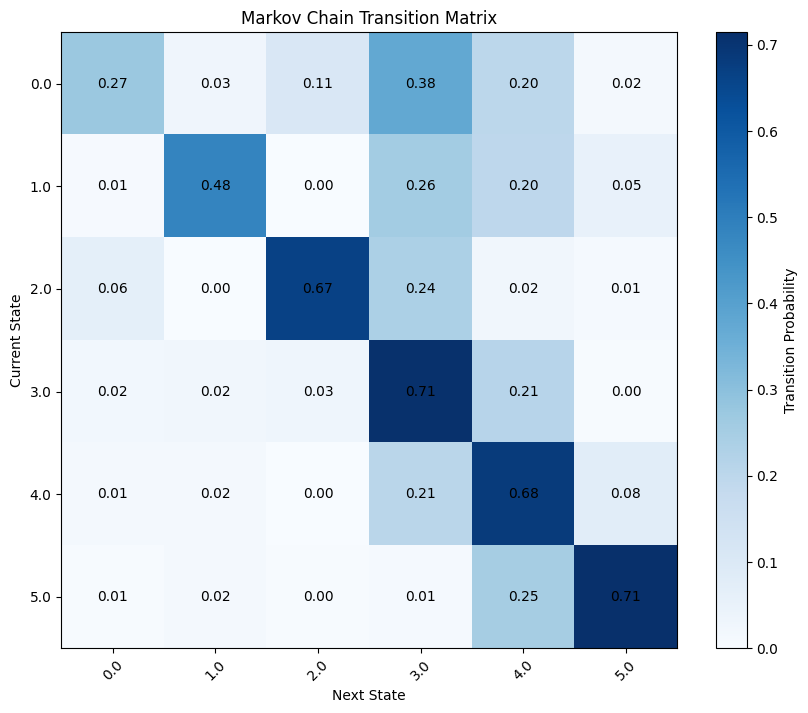

In [31]:
# Plot the transition matrix
plt.figure(figsize=(10, 8))
plt.imshow(transition_counts, cmap='Blues', interpolation='nearest')
plt.colorbar(label='Transition Probability')
plt.xticks(ticks=np.arange(n_states), labels=unique_states, rotation=45)
plt.yticks(ticks=np.arange(n_states), labels=unique_states)
plt.xlabel('Next State')
plt.ylabel('Current State')
plt.title('Markov Chain Transition Matrix')
# number labels
for i in range(n_states):
    for j in range(n_states):
        plt.text(j, i, f"{transition_counts[i, j]:.2f}", ha='center', va='center', color='black')
plt.show()

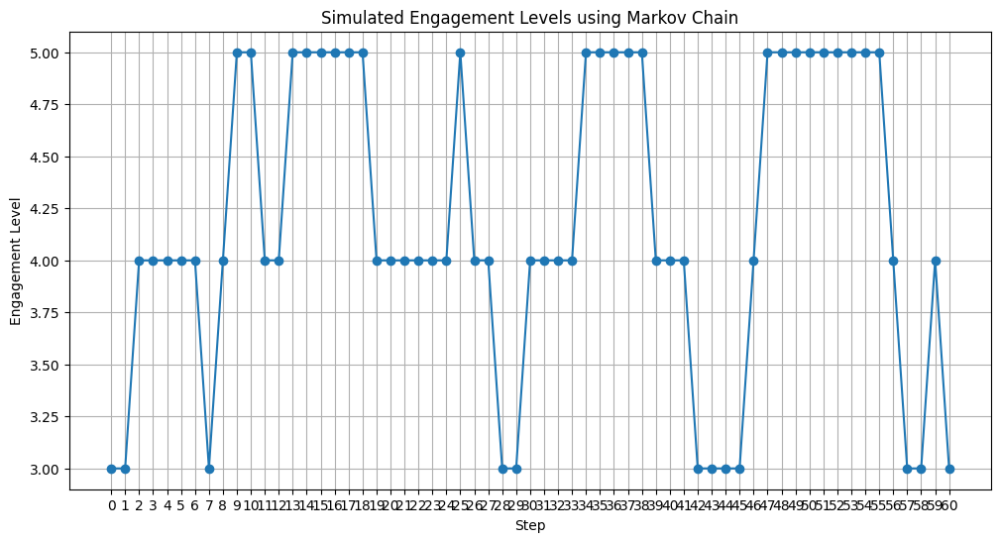

In [33]:
# Simulate the markov chain
n_steps = 60
#current_state = np.random.choice(unique_states)
current_state = 3.0
simulated_states = [current_state]
for _ in range(n_steps):
    current_idx = state_to_idx[current_state]
    next_state = np.random.choice(
        unique_states, p=transition_counts[current_idx])
    simulated_states.append(next_state)
    current_state = next_state

# Plot simulated states
plt.figure(figsize=(12, 6))
plt.plot(simulated_states, marker='o')
plt.xticks(ticks=np.arange(n_steps + 1))
plt.xlabel('Step')
plt.ylabel('Engagement Level')
plt.title('Simulated Engagement Levels using Markov Chain')
plt.grid()
plt.show()

In [34]:
P = transition_counts

In [40]:
import networkx as nx

def is_irreducible(P):
    """
    P: numpy array (n x n) transición
    devuelve True si la cadena es irreducible
    """
    n = P.shape[0]
    G = nx.DiGraph()
    G.add_nodes_from(range(n))
    for i in range(n):
        for j in range(n):
            if P[i, j] > 0:
                G.add_edge(i, j)
    return nx.is_strongly_connected(G)

In [41]:
from functools import reduce

def period_of_state(P, state, max_power=200):
    n = P.shape[0]
    # potencia acumulada
    A = np.eye(n)
    hits = []
    for power in range(1, max_power+1):
        A = A.dot(P)  # A = P^power
        if A[state, state] > 0:
            hits.append(power)
        # pequeño optim: si ya tenemos varios hits y gcd==1, rompemos
        if len(hits) >= 2:
            current_gcd = reduce(gcd, hits)
            if current_gcd == 1:
                return 1
    if not hits:
        return None  # no se encontró retorno en max_power (aumentar max_power)
    return reduce(gcd, hits)

def is_aperiodic(P, max_power=200):
    # si existe P_ii>0 en algún i y cadena irreducible => aperiódica
    if np.any(np.diag(P) > 0):
        return True
    # si no, calcule periodo de un estado (suponiendo irreducible)
    per = period_of_state(P, 0, max_power=max_power)
    return per == 1

In [44]:
is_irreducible(P), is_aperiodic(P)

(True, True)

In [35]:
vals, vectors = np.linalg.eig(P.T)

In [36]:
stationary = vectors[:, np.isclose(vals, 1)]

In [37]:
pi = stationary[:,0] / stationary[:,0].sum()

In [38]:
pi

array([0.02418746, 0.03561287, 0.04676218, 0.38077298, 0.39089393,
       0.12177058])

In [39]:
# tiempo medio de recurrencia:
mean_time = 1 / pi
mean_time

array([41.34374291, 28.07973372, 21.38480453,  2.62623674,  2.55823876,
        8.21216413])